In [ ]:
!pip install wordcloud
import wordcloud


In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
# Importing necessary libraries 
import os
import json
import pandas as pd
import numpy as np
import glob
from IPython import get_ipython


# For data cleaning and visualization
import pandas as pd
import numpy as np
from numpy import array
from datetime import date
from datetime import datetime, timedelta
import pandas_datareader.data as web


# For saving the model
import pickle

# For model Evaluation
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics
import math

import re
import nltk
from nltk.corpus import stopwords

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import nltk
# NLTK VADER for sentiment analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# Instantiate the sentiment intensity analyzer
vader = SentimentIntensityAnalyzer()

In [ ]:
df = pd.read_csv("news_headlines.csv", index_col = 0)
df

,headline,date
0,Nikkei down 1 4 pct on economy fears autos drop,2008-10-02
1,FOREX Dollar poised for biggest weekly gain in...,2008-10-03
2,GLOBAL MARKETS Stocks rally on Wells Wachovia ...,2008-10-03
3,GLOBAL MARKETS Stocks hold up after Wells Wach...,2008-10-03
4,GLOBAL MARKETS U S bailout plan passes inves...,2008-10-03
...,...,...
221508,Cisco Offers Gloomy Outlook on Revenue Earnin...,2020-02-13
221509,NFL notebook QB Newton s future depends on he...,2020-02-13
221510,Comerica taps Wells Fargo exec to head wealth ...,2020-02-13
221511,Wells Fargo ends forced arbitration for sexual...,2020-02-13


In [ ]:
headlines = ""
for i in df['headline']:
    headlines+=i.lower()+" "
headlines

'nikkei down 1 4 pct on economy fears  autos drop forex dollar poised for biggest weekly gain in 16 years global markets stocks rally on wells wachovia deal  dollar gains global markets stocks hold up after wells wachovia deal global markets u s  bailout plan passes  investors take profits global markets stocks worldwide  oil fall as crisis fears widen global markets credit crisis fears spark global stock rout global markets u s  stocks slide  gold rises on crisis jitters global markets equities slide amid investor doubts  gold jumps global markets stocks fall  gold rises despite global rate cuts global markets panic sweeps us stocks  oil off on recession fear global markets stocks falter  safe havens fall amid market calm global markets stocks stumble as doubts rise on rate cut efforts global markets selling frenzy persists as confidence crumbles global markets global stocks slide  gold rises on recession fear global markets u s  stocks plunge on recession scare  gold rises global mar

In [ ]:
stopwords = set(STOPWORDS)
wordcloud = WordCloud(width = 1000, height = 1000,
                background_color ='black',
                      stopwords = stopwords,
                min_font_size = 12).generate(headlines)

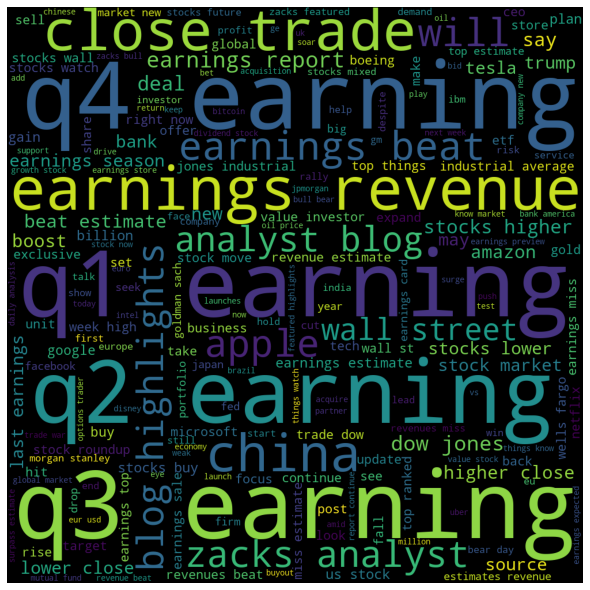

In [ ]:
# plot the WordCloud image                       
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)  
plt.show()

In [ ]:
headline_list = headlines.split(" ")
headline_list

In [ ]:
headline_list2 = []
for i in headline_list:
    s = str(i.lower())
    if (s not in stopwords) and (not s.isnumeric()) and (len(s)>1):
        headline_list2.append(s)
headline_list2

In [ ]:
l = len(headline_list2)
hl1 = headline_list2[0:int(l/5)]
hl2 = (headline_list2[int(l/5):int(2*l/5)])
hl3 = (headline_list2[int(2*l/5):int(3*l/5)])
hl4 = (headline_list2[int(3*l/5):int(4*l/5)])
hl5 = (headline_list2[int(4*l/5):])
len(hl1), len(hl3), len(hl5)

(309761, 309762, 309762)

In [ ]:
sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

for word in hl1:
    if (sid.polarity_scores(word)['compound']) >= 0.5:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.5:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)                



In [ ]:
for word in hl2:
    if (sid.polarity_scores(word)['compound']) >= 0.5:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.5:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

In [ ]:
for word in hl3:
    if (sid.polarity_scores(word)['compound']) >= 0.5:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.5:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

In [ ]:
for word in hl4:
    if (sid.polarity_scores(word)['compound']) >= 0.5:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.5:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

In [ ]:
for word in hl5:
    if (sid.polarity_scores(word)['compound']) >= 0.5:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.5:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

In [ ]:
len(neu_word_list)

1520803

In [ ]:
#neg_word_list.remove("cancer")
neg_word_list = list(filter(lambda x: x != 'cancer', neg_word_list))
neu_word_list = list(filter(lambda x: x.lower() not in ['earning', 'earnings','q4','q1','q3','q4'], neu_word_list))

In [ ]:
positive_words = " ".join(pos_word_list)
negative_words = " ".join(neg_word_list)
neutral_words = " ".join(neu_word_list)

In [ ]:
stopwords = set(STOPWORDS)
wordcloud_pos = WordCloud(width = 1000, height = 1000,
                background_color ='black',
                      stopwords = stopwords,
                min_font_size = 12).generate(positive_words)

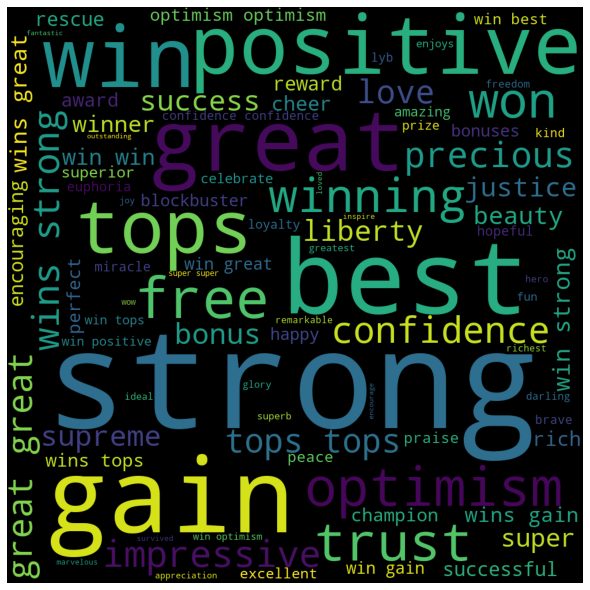

In [ ]:
# plot the WordCloud image                       
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud_pos)
plt.axis("off")
plt.tight_layout(pad = 0)  
plt.show()

In [ ]:
wordcloud_neg = WordCloud(width = 1000, height = 1000,
                background_color ='black',
                      stopwords = stopwords,
                min_font_size = 14).generate(negative_words)

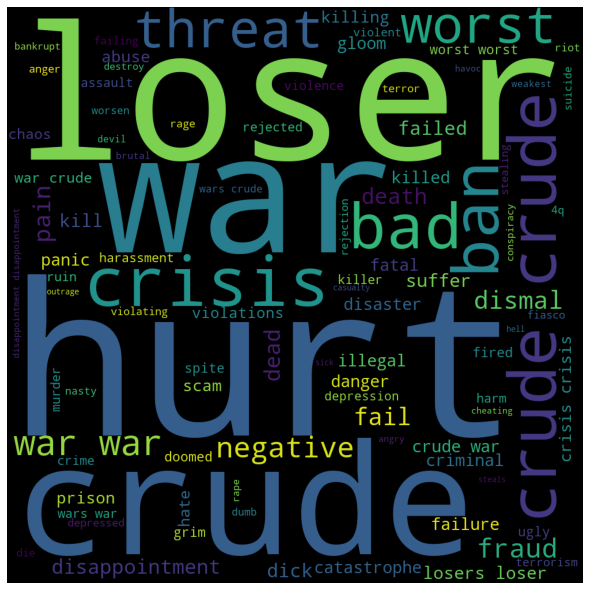

In [ ]:
# plot the WordCloud image                       
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud_neg)
plt.axis("off")
plt.tight_layout(pad = 0)  
plt.show()

In [ ]:
wordcloud_neu = WordCloud(width = 1000, height = 1000,
                background_color ='black',
                      stopwords = stopwords,
                min_font_size = 14).generate(neutral_words)

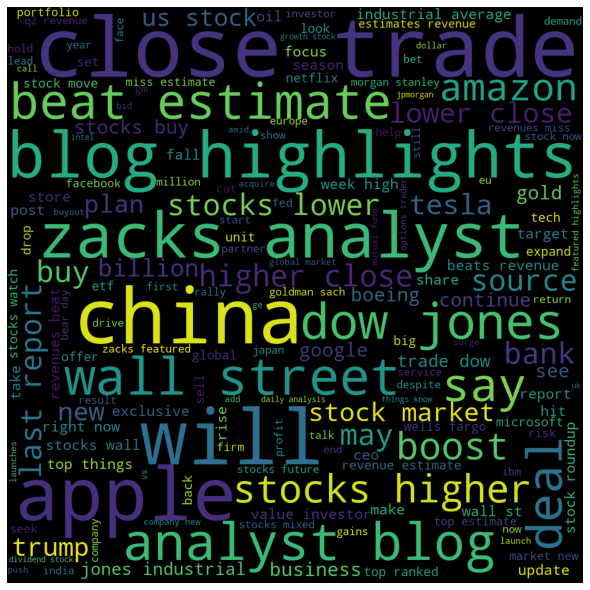

In [ ]:
# plot the WordCloud image                       
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud_neu)
plt.axis("off")
plt.tight_layout(pad = 0)  
plt.show()